In [1]:
import os
# Seleccio GPUs visibles
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID" 
os.environ["CUDA_VISIBLE_DEVICES"]="3,4"

In [2]:
import torch
import torch.optim as optim
import torchvision
from torchvision import transforms
from torchvision.transforms.functional import to_tensor
from torchvision.transforms import Resize
from torch.utils.data import DataLoader
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torch.nn as nn
%cd /tf/detectron2
import detectron2
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog
from detectron2.data import DatasetCatalog
from detectron2.data import transforms as T
from detectron2.utils.logger import setup_logger
setup_logger()
from PIL import Image, ImageDraw
from scipy.optimize import linear_sum_assignment
import torch.nn.functional as F
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import json

/usr/lib/python3/dist-packages/requests/__init__.py:89: RequestsDependencyWarning: urllib3 (1.25.8) or chardet (5.1.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


/tf/detectron2


In [ ]:
# xmin, ymin, xmax, ymax to xmin, ymin, w, h
def xyxy_to_xywh(coordenadas):
    coordenadas = torch.stack((coordenadas[:, 0],
                               coordenadas[:, 1],
                               coordenadas[:, 2] - coordenadas[:, 0],
                               coordenadas[:, 3] - coordenadas[:, 1]
                               ), dim=1)
    return coordenadas

# xmin, ymin, w, h to xmin, ymin, xmax, ymax
def xywh_to_xyxy(coordenadas):
    coordenadas = torch.stack((coordenadas[:, 0], 
                               coordenadas[:, 1], 
                               coordenadas[:, 0] + coordenadas[:, 2],
                               coordenadas[:, 1] + coordenadas[:, 3]
                               ), dim=1)
    return coordenadas

In [4]:
class PoolDetectionModel(nn.Module):
    def __init__(self, num_classes, num_predictions = False):
        super(PoolDetectionModel, self).__init__()
        
        # Cargamos el modelo pre-entrenado
        self.model = torch.hub.load('facebookresearch/detr:main', 'detr_resnet50', pretrained=True)

        # Cambiamos el número de clases de salida
        hidden_dim = self.model.transformer.d_model
        self.model.num_classes = num_classes
        self.model.class_embed = nn.Linear(hidden_dim, num_classes)
        
        if num_predictions != False:
          # Cambiamos el número predicciones
          num_query = self.model.transformer.d_model
          self.model.query_embed = nn.Embedding(num_predictions, num_query)
        
    def forward(self, x):
        # Pasamos las imágenes por el modelo pre-entrenado
        outputs = self.model(x)
        
        # Obtenemos las cajas y las etiquetas de las predicciones
        boxes = outputs['pred_boxes']
        labels = outputs['pred_logits'].sigmoid()
        
        # Devolvemos las cajas y las etiquetas
        return boxes, labels

In [5]:
def hungarian_loss(outputs, targets):
    boxes, labels = outputs
    true_boxes, true_labels = torch.FloatTensor(targets['boxes']).to(device), torch.FloatTensor(targets['labels']).to(device)
    true_labels = torch.FloatTensor([[label] for label in true_labels]).to(device)

    # Calculamos el costo de emparejamiento entre las cajas predichas y verdaderas
    cost_boxes = torch.cdist(boxes, true_boxes, p=1)
    
    # Calculamos el costo de emparejamiento entre las etiquetas predichas y verdaderas
    cost_labels = torch.cdist(labels, true_labels, p=1)
    
    # Combinamos los costos
    cost = cost_boxes + cost_labels
    
    # Resolvemos el problema de asignación lineal
    row_ind, col_ind = linear_sum_assignment(cost.cpu().detach().numpy())
    
    # Obtenemos las cajas y etiquetas predichas emparejadas
    boxes = boxes[row_ind]
    labels = labels[row_ind]
    
    # Obtenemos las cajas y etiquetas verdaderas emparejadas
    true_boxes = true_boxes[col_ind]
    true_labels = true_labels[col_ind]

    # Calculamos la pérdida de IoU para las cajas
    box_loss = F.mse_loss(boxes, true_boxes)
    
    # Calculamos la entropía cruzada binaria para las etiquetas
    label_loss = F.binary_cross_entropy(labels, true_labels)
    
    # Combinamos las pérdidas
    loss = box_loss + label_loss
    
    return loss

In [6]:
def object_detection_loss(output, target):
    bbox_pred = torch.squeeze(output[0])
    prob_pred = torch.squeeze(output[1])

    bbox_true = torch.FloatTensor([t["boxes"][0] for t in target]).to(device)

    # prob_true = torch.FloatTensor([label for t in target for label in t["labels"]]).to(device)
    prob_true = torch.FloatTensor([t["labels"][0] for t in target]).to(device)


    # Calcula la pérdida de entropía cruzada con pesos para la clasificación
    classification_loss = F.binary_cross_entropy(prob_pred, prob_true)

    # Recorte provisional de las bbtrue
    

    # Calcula la pérdida de error cuadrático medio para la regresión
    regression_loss = F.mse_loss(bbox_pred, bbox_true)

    # Combina las pérdidas de clasificación y regresión
    loss = classification_loss + regression_loss

    return loss

In [7]:
def collate_fn(batch):
    images = []
    targets = []
    transform = transforms.Resize(new_size)
    # Define the normalization transform
    resize = transforms.Resize(new_size)
    normalize = transforms.Normalize(mean=[0.53016539, 0.48067732, 0.410102], std=[0.25151319, 0.2374013, 0.23417556])
    transform = transforms.Compose([transforms.ToTensor(), resize, normalize])
    for sample in batch:
        image = Image.open(sample['file_name']).convert('RGB')
        width, height = image.size
        # Transformar la imagen
        image = transform(image)
        # Adaptar las anotaciones
        annotations = sample['annotations']
        for ann in annotations:
            bbox = ann['bbox']
            x_original, y_original, w_original, h_original = bbox
            x_new = x_original / width #* new_size[1]
            y_new = y_original / height #* new_size[0]
            w_new = w_original / width #* new_size[1]
            h_new = h_original / height #* new_size[0]
            ann['bbox'] = [x_new, y_new, w_new, h_new]
#             print(ann['bbox'])
        
        # Añadir la imagen y las anotaciones a la lista
        if len(annotations) != 0:
            images.append(image)
            targets.append({'boxes': [ann['bbox'] for ann in annotations], 'labels': [1 for ann in annotations if ann['category_id'] == 0]})
            # targets[-1]['boxes'].append([0, 0, 0, 0])
            # targets[-1]['labels'].append(0)
    return images, targets

In [8]:
def collate_fn_test(batch):
    images = []
    targets = []
    transform = transforms.Resize(new_size)
    resize = transforms.Resize(new_size)
    transform = transforms.Compose([transforms.ToTensor(), resize])
    for sample in batch:
        image = Image.open(sample['file_name']).convert('RGB')
        width, height = image.size
        # Transformar la imagen
        image = transform(image)
        # Adaptar las anotaciones
        annotations = sample['annotations']
        for ann in annotations:
            bbox = ann['bbox']
            x_original, y_original, w_original, h_original = bbox
            x_new = x_original / width #* new_size[1]
            y_new = y_original / height #* new_size[0]
            w_new = w_original / width #* new_size[1]
            h_new = h_original / height #* new_size[0]
            ann['bbox'] = [x_new, y_new, w_new, h_new]
            # print(bbox)
            # print(ann['bbox'])
        
        # Añadir la imagen y las anotaciones a la lista
        images.append(image)
        targets.append({'boxes': [ann['bbox'] for ann in annotations], 'labels': [1 for ann in annotations if ann['category_id'] == 0]})
    return images, targets

In [9]:
def train(model, optimizer, data_loader, device, losses, epochs, current_epoch):
    model.train()

    for name, param in model.named_parameters():
        if "query_embed" not in name and "bbox_embed" not in name:
            param.requires_grad = False
        else:
          print("No congelando:", name)
    for epoch in range(current_epoch, epochs):
      print("\nEpoch:", epoch, "\n")
      loss_epoch = []
      for images, targets in tqdm(data_loader):
          images = [image.to(device) for image in images]
          targets = [{k: v for k, v in t.items()} for t in targets]
          optimizer.zero_grad()
          output = model(images)
          loss = hungarian_loss_2(output, targets)
          loss.backward()
          optimizer.step()
          scheduler.step()
          loss = loss.item()/len(images)
#           print(loss)
          loss_epoch.append(loss)
          if len(losses) > 2 and abs(losses[-1] - losses[-2]) < 10**-6:
            return
      losses = losses+loss_epoch
      torch.save(model, f"{paths['test']}model_{epoch}.pt")
      with open(f"{paths['test']}model_loss_{epoch}.json", 'w') as f:
        json.dump(losses, f)
      print(" Model saved")
      print("loss:", loss)
    return 

In [10]:
def declarar_modelo(paths, paramaters, Load_model = False):
    # Calculate current number of test
    current_test = get_current_test(paths["tests"])
    if Load_model:
        # Load model
        model = PoolDetectionModel(num_classes=paramaters["num_classes"], num_predictions = paramaters["num_predictions"])
        # Path to current test
        path_current_test = f'{paths["tests"]}test {current_test}/'
        paths["test"] = path_current_test
        # Calculate current epoch in test
        current_epoch = get_current_epoch(path_current_test)
        # Load model parameters
        model = torch.load(f'{path_current_test}model_{current_epoch}.pt')
        # Get previus losses
        with open(f"{path_current_test}model_loss_{current_epoch}.json", 'r') as f:
            train_loss = json.load(f)
        with open(f"{path_current_test}parameters.json", 'r') as f:
            paramaters = json.load(f)
        paramaters["current_epoch"] = current_epoch+1
        print(f"Load model {path_current_test}model_{current_epoch}.pt")
        print(f"Load parameters {paramaters}")
    else:
        # Create list of losses
        train_loss = []
        # Load model
        model = PoolDetectionModel(num_classes=paramaters["num_classes"])#, num_predictions = paramaters["num_predictions"])
        # Path to new test
        path_current_test = f'{paths["tests"]}test {current_test+1}/'
        # Create directori of the new test
        os.makedirs(path_current_test)
        # Save parameters
        with open(f"{path_current_test}parameters.json", 'w') as f:
            json.dump(paramaters, f)
        paths["test"] = path_current_test
        paramaters["current_epoch"] = 1
        print("New Model")
        print(path_current_test)
        print(f"Parameters {paramaters}")
    return model, paramaters, train_loss

def get_current_epoch(path):
    list_names = os.listdir(path)
    list_names = [int(namefile[6:-3]) for namefile in list_names if namefile.endswith(".pt")]
    return max(list_names)

def get_current_test(path):
    list_tests = sorted(os.listdir(path))
    list_tests.pop(0)
    list_tests = [int(namefile[5:]) for namefile in list_tests]
    return max(list_tests)

In [16]:
def hungarian_loss_2(outputs, targets):
    # reorder outputs and targets based in the hungarian algorithm without breaking the computation graph
    # outputs are the predicted bounding boxes and labels in the format ([batch_size, num_queries, 4], [batch_size, num_queries, num_classes])
    # targets are the ground truth bounding boxes and labels in the format [{'boxes': [x1, y1, x2, y2], 'labels': [0, 1, 2, 3]}, {'boxes': [x1, y1, x2, y2], 'labels': [0, 1, 2, 3]}]
    # the loss is calculated as the sum of the l1 loss, the iou loss and the classification loss
    pred_boxes, pred_labels = outputs
    print(pred_labels.shape)

    # convert the targets to the same format as the outputs
    true_boxes = [torch.tensor(target['boxes'], dtype=torch.float32).to(device) for target in targets]
    true_labels = [torch.tensor(target['labels'], dtype=torch.float32).to(device) for target in targets]

    print(pred_boxes)
    print(pred_labels)
    print(true_boxes)
    print(true_labels)
    
    # create mask to remove padded elements
    mask_pred = torch.zeros(pred_boxes.shape[0], pred_boxes.shape[1], pred_boxes.shape[2], dtype=torch.bool).to(device)
    for n in range(pred_boxes.shape[0]):
        row_ind, col_ind = hungarian((true_boxes[n], true_labels[n]), (pred_boxes[n], pred_labels[n]))
        true_boxes[n] = true_boxes[n][col_ind]
        true_labels[n] = true_labels[n][col_ind]
        pred_boxes[n, :, :] = torch.cat((pred_boxes[n][row_ind], torch.zeros(pred_boxes.shape[1] - len(row_ind), 4)), dim=0)
        pred_labels[n, :, :] = torch.cat((pred_labels[n][row_ind], torch.zeros(pred_boxes.shape[1] - len(row_ind), 1)), dim=0)
    
    # prepare the boxes and labels for the loss function
    pred_boxes = pred_boxes.flatten(0, 1)
    pred_labels = pred_labels.flatten(0, 1)
    pred_boxes = pred_boxes[~torch.all(pred_boxes == 0, dim=1)]
    pred_labels = pred_labels[~torch.all(pred_labels == 0, dim=1)]
    true_boxes = torch.cat(true_boxes)
    true_labels = torch.cat(true_labels).unsqueeze(1)

    
    print(pred_boxes)
    print(pred_labels)
    print(true_boxes)
    print(true_labels)
    

    # Calculate the losses
    l1 = torch.nn.functional.l1_loss(pred_boxes, true_boxes)
    # iou = torchvision.ops.complete_box_iou_loss(pred_boxes, true_boxes, reduction = "mean")
    iou = torchvision.ops.distance_box_iou_loss(pred_boxes, true_boxes, reduction = "mean")
    classification = torch.nn.functional.binary_cross_entropy(pred_labels, true_labels)
    
    # Combinamos las pérdidas
    l1_weight, iou_weight, classification_weight = 1.0, 2.0, 1.0
    loss = l1_weight * l1 + iou_weight * iou + classification_weight * classification
    
    return loss

def hungarian(true, pred):
    true_boxes, true_labels = true
    boxes, labels = pred
    
    true_labels = true_labels.unsqueeze(1)
    
    # Calculamos el costo de emparejamiento entre las cajas predichas y verdaderas
    cost_boxes = torch.cdist(boxes, true_boxes, p=1)
    
    # Calculamos el costo de emparejamiento entre las etiquetas predichas y verdaderas
    cost_labels = torch.cdist(labels, true_labels, p=1)
    
    # Combinamos los costos
    cost = cost_boxes + cost_labels
    
    # Resolvemos el problema de asignación lineal
    row_ind, col_ind = linear_sum_assignment(cost.cpu().detach().numpy())
    
    return row_ind, col_ind

In [20]:
path_dataset = "/tf/data/tmp/PoolsDS/"
paths = {"dataset": f"{path_dataset}",
         "tests": f"{path_dataset}tests/",
         "annotations_train": f"{path_dataset}annotations_4_recounted_train.json",
         "annotations_test": f"{path_dataset}annotations_4_recounted_test.json",
         "images": f"{path_dataset}images"
         }

paramaters = {"learning_rate": 0.0001,
              "max_lr": 0.01,
              "momentum": 0.9,
              "batch_size": 4,
              "epochs": 100, 
              "num_classes": 1,
              "num_predictions": 100,
              }


Load_model = True
new_size = (700, 700)


DatasetCatalog.clear()
MetadataCatalog.clear()

# Declarar el modelo 
model, paramaters, train_loss = declarar_modelo(paths, paramaters, Load_model = Load_model)

# Declarar el optimizador
# optimizer = optim.SGD(model.parameters(), lr=paramaters["learning_rate"], momentum=paramaters["momentum"])
optimizer = optim.Adam(model.parameters(), lr=paramaters["learning_rate"])

# Declarar el scheduler
scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=paramaters["learning_rate"], max_lr=paramaters["max_lr"], cycle_momentum=False)

# Registrar instancia de COCO
register_coco_instances("piscinas_entrenamiento", {}, paths["annotations_train"], paths["images"])
# Cargar la instancia de COCO como un objeto Dataset
dataset_name = "piscinas_entrenamiento"
dataset = DatasetCatalog.get(dataset_name)
# Obtener metadatos del dataset
metadata = MetadataCatalog.get(dataset_name)
# Declarar el DataLoader
data_loader_train = DataLoader(dataset, batch_size=paramaters["batch_size"], collate_fn=collate_fn, shuffle=True)

# Registrar instancia de COCO
register_coco_instances("piscinas_test", {}, paths["annotations_test"], paths["images"])
# Cargar la instancia de COCO como un objeto Dataset
dataset_name = "piscinas_test"
dataset = DatasetCatalog.get(dataset_name)
# Obtener metadatos del dataset
metadata = MetadataCatalog.get(dataset_name)
# Declarar el DataLoader
data_loader_test = DataLoader(dataset, batch_size=paramaters["batch_size"], collate_fn=collate_fn)

# Declarar el dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Mover el modelo y el DataLoader al dispositivo
model.to(device)
train(model, optimizer, data_loader_train, device, train_loss, paramaters["epochs"], paramaters["current_epoch"])

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main


Load model /tf/data/tmp/PoolsDS/tests/test 8/model_14.pt
Load parameters {'learning_rate': 0.0001, 'max_lr': 0.01, 'momentum': 0.9, 'batch_size': 4, 'epochs': 100, 'num_classes': 1, 'num_predictions': 100, 'current_epoch': 15}
WARNING [05/19 22:50:01 d2.data.datasets.coco]: /tf/data/tmp/PoolsDS/annotations_4_recounted_train.json contains 101310 annotations, but only 101299 of them match to images in the file.
[05/19 22:50:01 d2.data.datasets.coco]: Loaded 12654 images in COCO format from /tf/data/tmp/PoolsDS/annotations_4_recounted_train.json
WARNING [05/19 22:50:01 d2.data.datasets.coco]: /tf/data/tmp/PoolsDS/annotations_4_recounted_test.json contains 13567 annotations, but only 13563 of them match to images in the file.
[05/19 22:50:01 d2.data.datasets.coco]: Loaded 1582 images in COCO format from /tf/data/tmp/PoolsDS/annotations_4_recounted_test.json
No congelando: model.bbox_embed.layers.0.weight
No congelando: model.bbox_embed.layers.0.bias
No congelando: model.bbox_embed.layers.1

100%|██████████| 3164/3164 [09:12<00:00,  5.73it/s]


 Model saved
loss: 1.1769174337387085

Epoch: 16 



100%|██████████| 3164/3164 [09:13<00:00,  5.71it/s]


 Model saved
loss: 1.159112811088562

Epoch: 17 



100%|██████████| 3164/3164 [09:13<00:00,  5.72it/s]


 Model saved
loss: 1.1588994264602661

Epoch: 18 



100%|██████████| 3164/3164 [09:14<00:00,  5.71it/s]


 Model saved
loss: 1.158604621887207

Epoch: 19 



100%|██████████| 3164/3164 [09:09<00:00,  5.76it/s]


 Model saved
loss: 1.1587951183319092

Epoch: 20 



100%|██████████| 3164/3164 [09:10<00:00,  5.75it/s]


 Model saved
loss: 1.1587632894515991

Epoch: 21 



 12%|█▏        | 394/3164 [01:07<08:22,  5.51it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 3164/3164 [09:08<00:00,  5.77it/s]


 Model saved
loss: 1.158312439918518

Epoch: 22 



  2%|▏         | 49/3164 [00:08<10:06,  5.13it/s]

In [23]:
current_test = 8
current_epoch = 24
path_current_test = f'{paths["tests"]}test {current_test}/'
with open(f"{path_current_test}model_loss_{current_epoch}.json", 'r') as f:
    train_loss = json.load(f)
model = torch.load(f'{path_current_test}model_{current_epoch}.pt')


{'learning_rate': 0.0001, 'max_lr': 0.01, 'momentum': 0.9, 'batch_size': 4, 'epochs': 100, 'num_classes': 1, 'num_predictions': 100, 'current_epoch': 15}


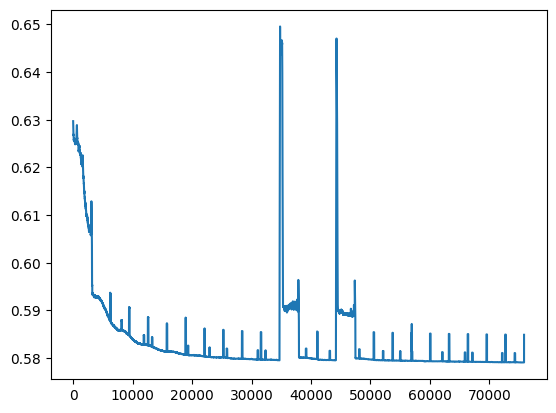

In [24]:
N = 100
plt.plot(np.convolve(train_loss, np.ones(N)/N, mode='valid'))
print(paramaters)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4
43


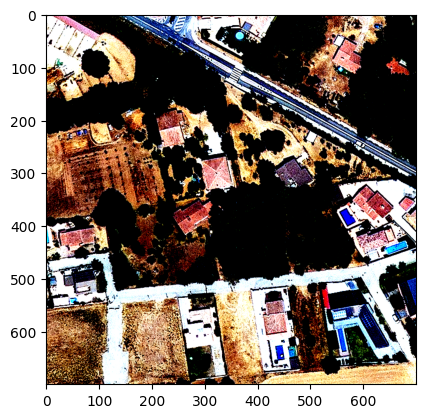

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4
40


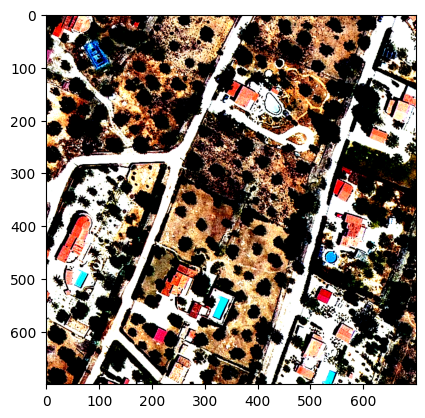

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12
44


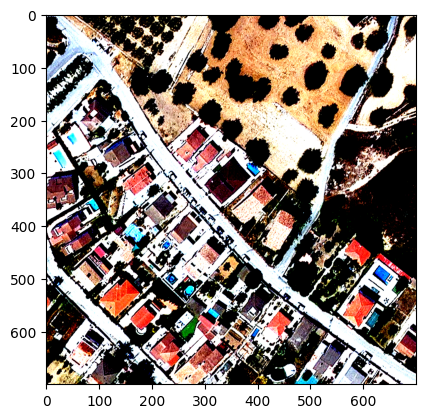

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7
44


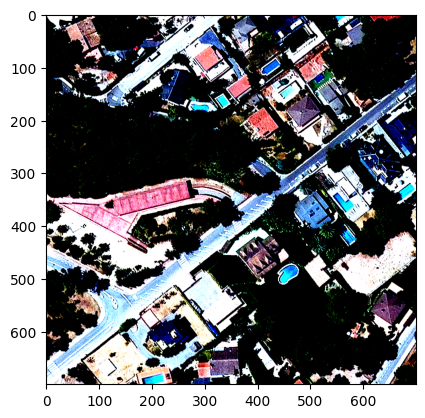

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8
44


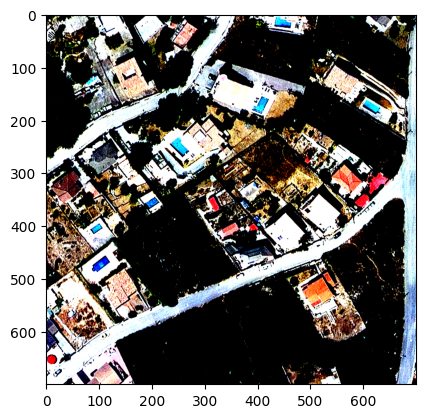

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8
44


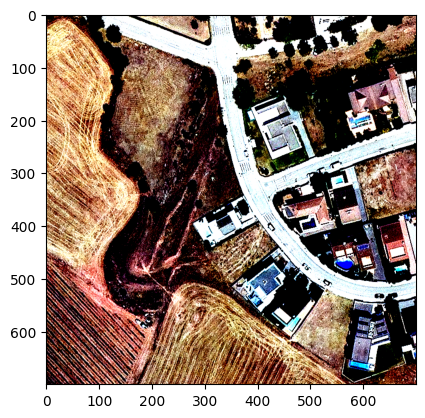

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13
43


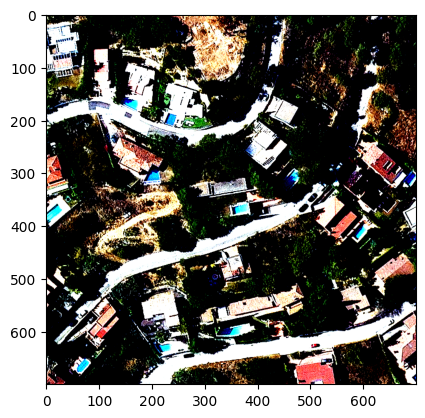

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13
43


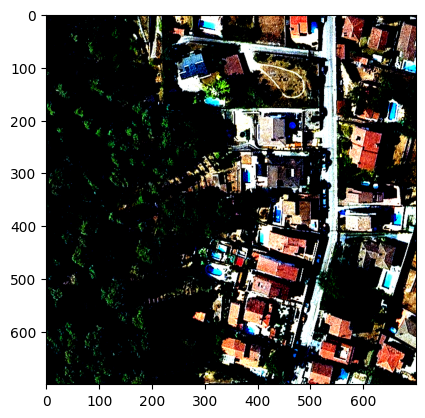

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9
40


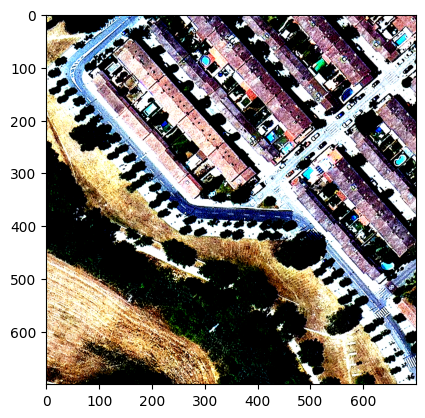

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7
43


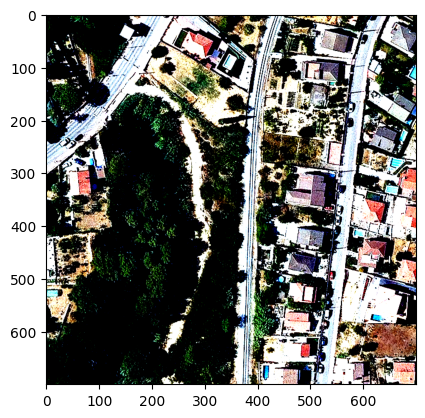

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
45


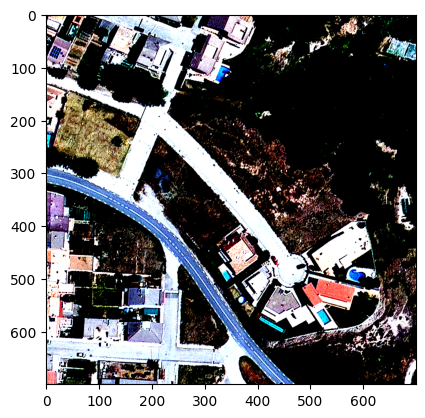

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8
45


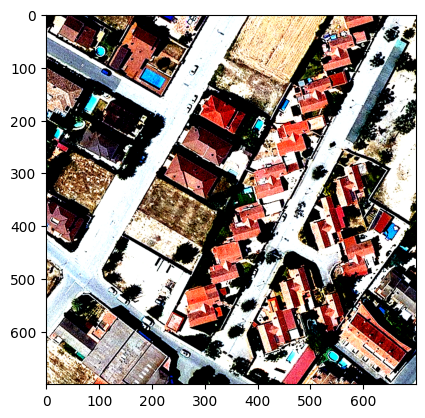

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
43


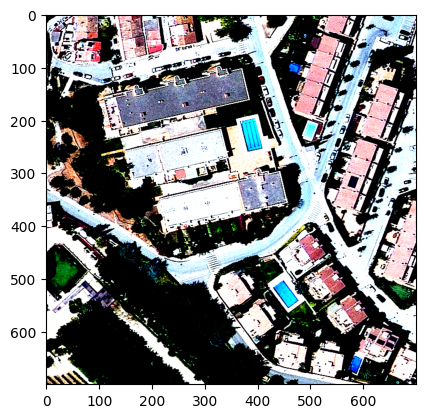

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11
42


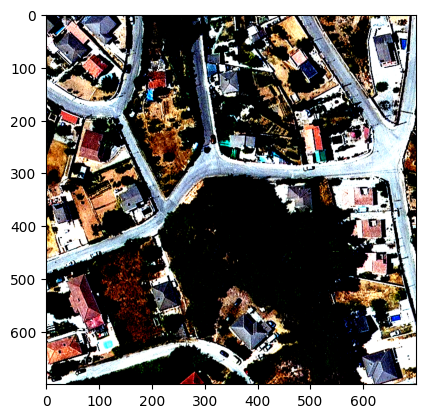

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4
41


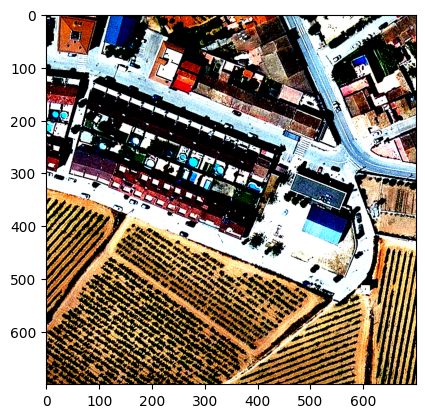

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
42


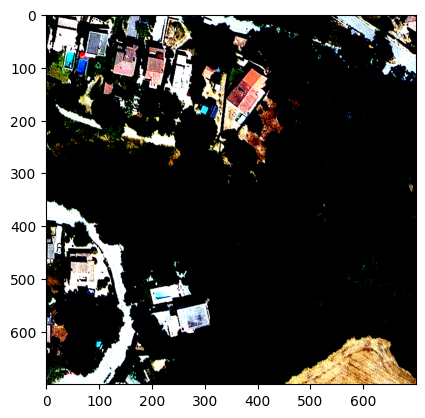

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
43


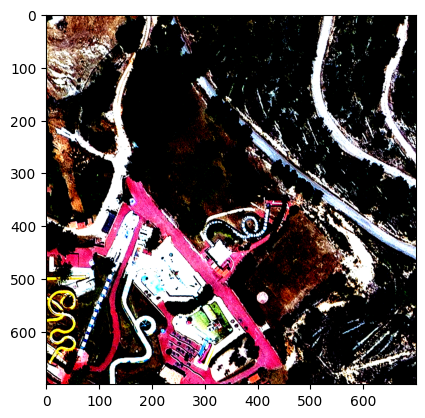

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
44


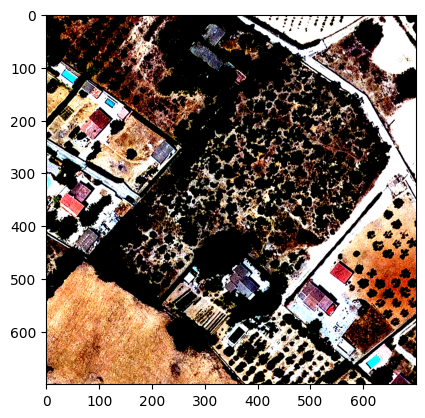

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
43


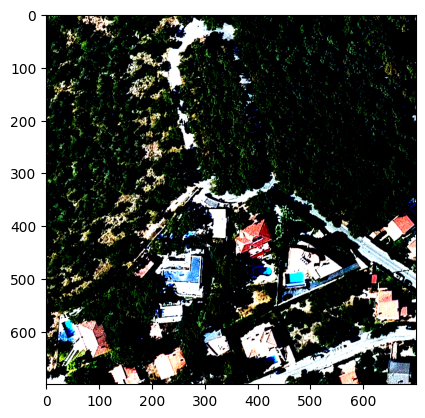

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


18
44


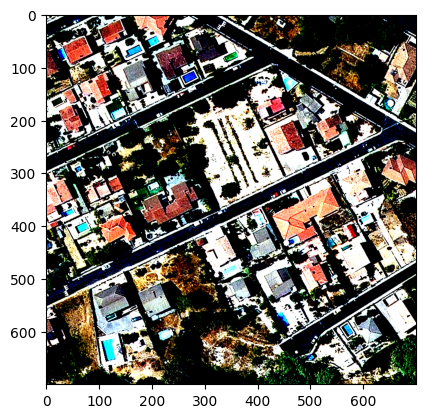

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14
44


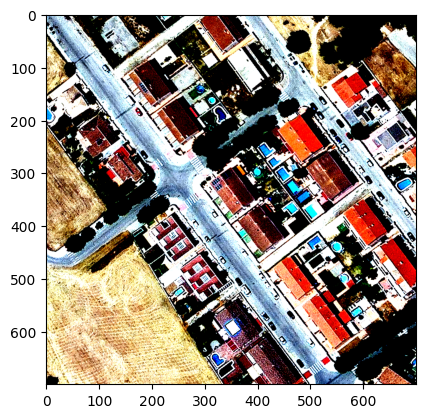

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
43


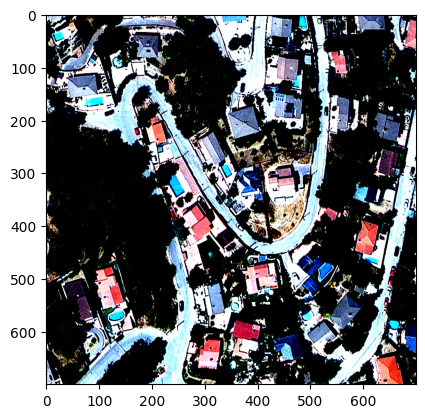

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6
44


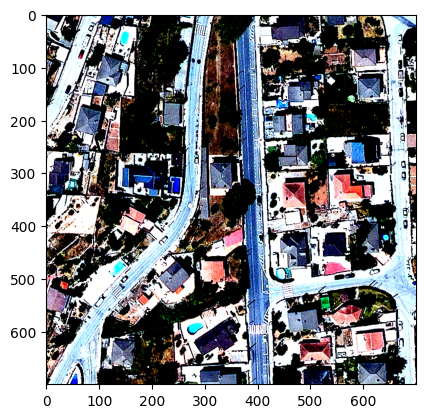

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4
42


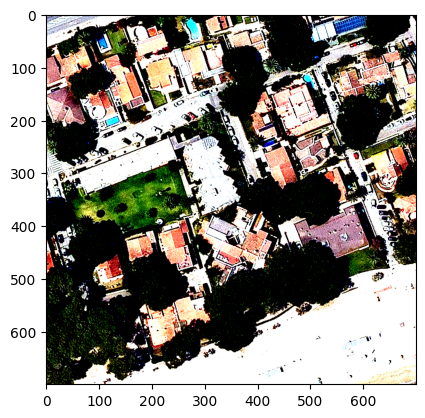

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


16
43


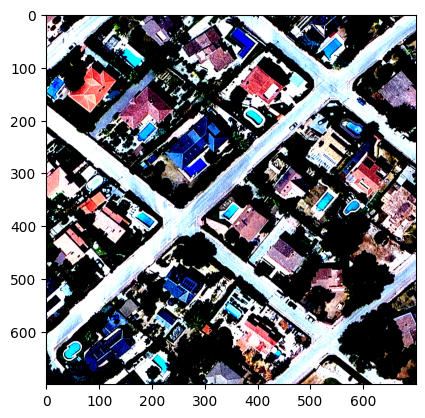

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
40


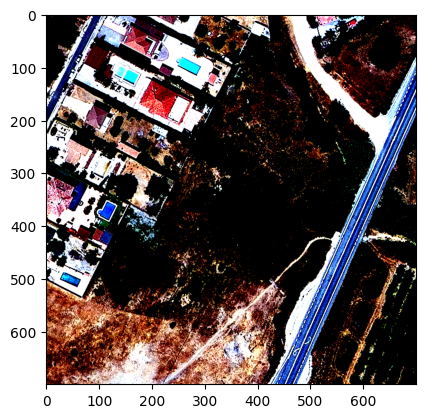

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12
46


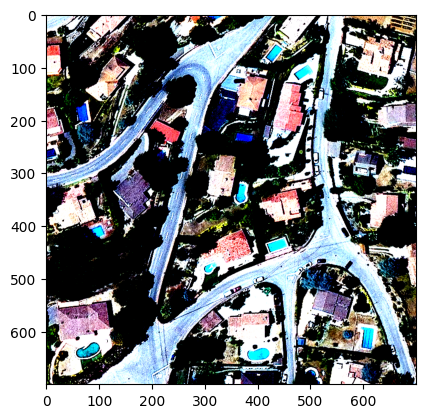

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


16
46


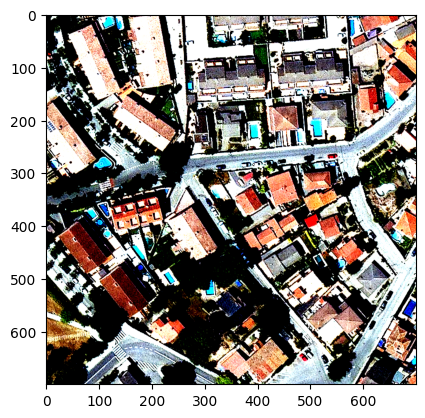

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12
42


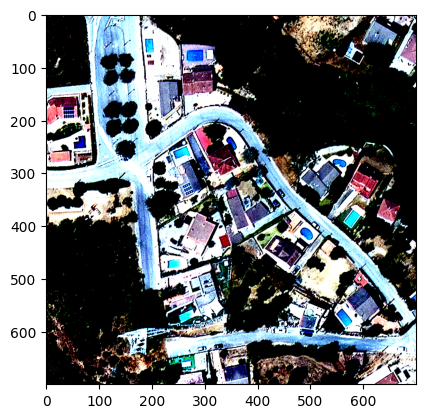

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4
42


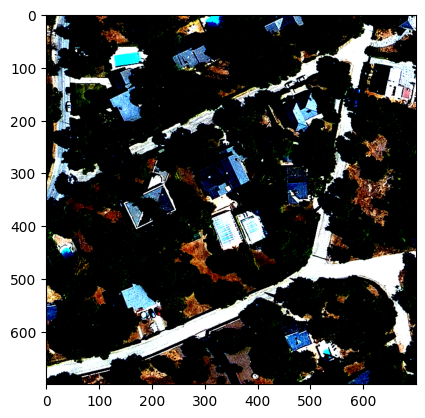

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11
41


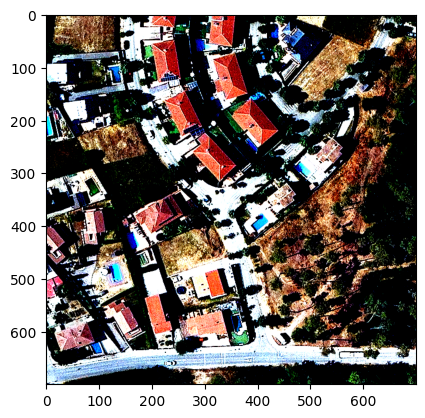

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14
40


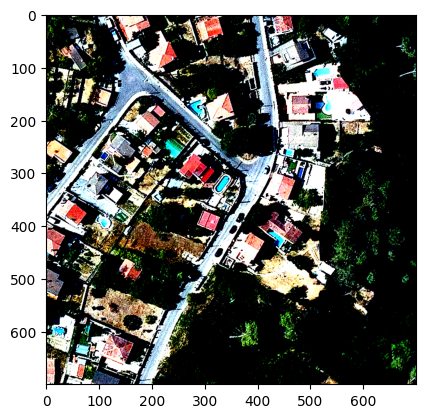

4
42


KeyboardInterrupt: 

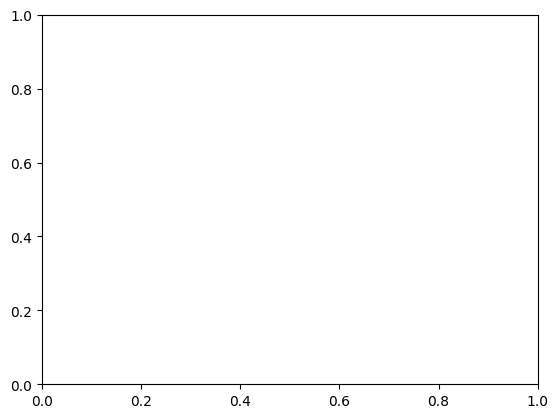

In [25]:
threshold = 0.9

for images, targets in data_loader_train:
  images = [image.to(device) for image in images]
  targets = [{k: v for k, v in t.items()} for t in targets]
  output = model(images)
  for n in range(len(images)):
    fig, ax = plt.subplots()
    image = images[n].cpu().numpy()
    image = np.moveaxis(image, 0, -1)
    print(len(targets[n]["boxes"]))
    print(sum(output[1][n]>threshold).item())
    for bounding_box, target in zip(output[0][n], output[1][n]):
      if target > threshold:
        x, y, w, h = bounding_box.cpu().detach().numpy()
        x, y, w, h = x*new_size[0], y*new_size[1], w*new_size[0], h*new_size[1]
#         print(target.item(), x, y, w, h)
        bb = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(bb)
    ax.imshow(image)
    plt.show()

In [26]:
output

(tensor([[[6.0219e-03, 2.3141e-06, 3.0429e-04, 6.6226e-05],
          [7.3056e-17, 1.6396e-17, 8.8501e-21, 6.2258e-16],
          [4.2341e-15, 4.7619e-16, 1.2422e-17, 2.5310e-14],
          ...,
          [5.1822e-14, 4.9736e-15, 3.3888e-13, 1.0315e-12],
          [1.6957e-10, 1.5200e-09, 3.1176e-08, 9.4067e-09],
          [8.2377e-18, 1.6712e-18, 8.6452e-22, 1.0021e-16]],
 
         [[1.4769e-06, 1.7642e-07, 2.1360e-01, 3.8669e-01],
          [8.6854e-19, 2.7783e-19, 4.6548e-23, 1.7009e-17],
          [9.3976e-19, 1.6184e-19, 1.8469e-22, 1.8923e-17],
          ...,
          [4.3088e-18, 1.4916e-19, 1.1223e-22, 2.1002e-17],
          [4.5258e-08, 8.9283e-08, 8.1632e-07, 2.6436e-07],
          [2.6810e-16, 1.3337e-16, 2.2492e-18, 6.4503e-15]],
 
         [[5.2624e-09, 1.7684e-09, 1.4754e-07, 2.5171e-08],
          [4.0391e-16, 9.3707e-17, 5.8776e-19, 4.3960e-15],
          [1.6492e-16, 4.9794e-17, 3.2730e-19, 2.5605e-15],
          ...,
          [1.6926e-15, 2.7359e-16, 4.5502e-15, 6.

In [25]:
import shutil
shutil.rmtree("/tf/data/tmp/PoolsDS/tests/test 8")